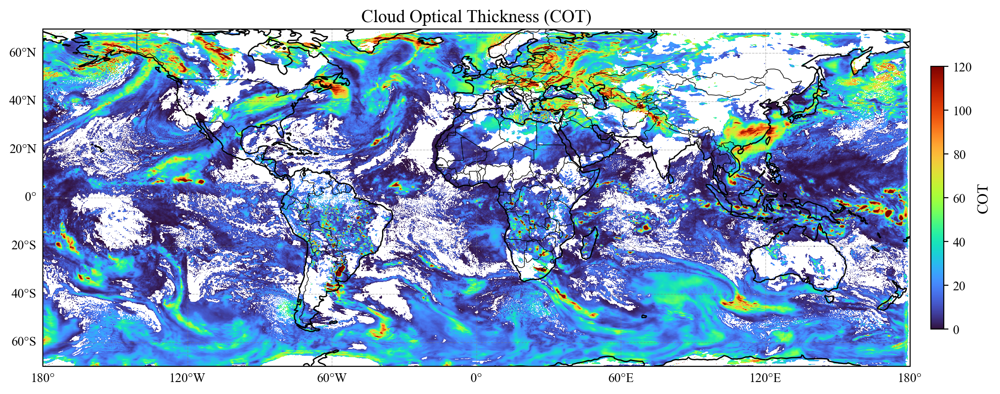

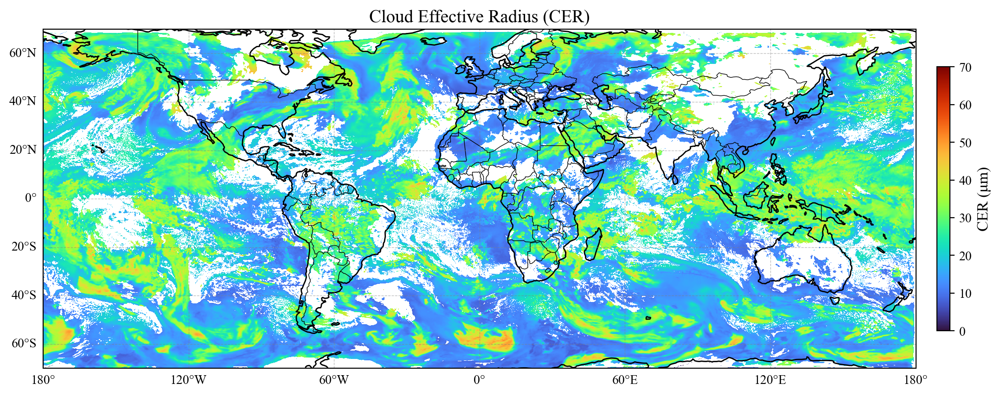

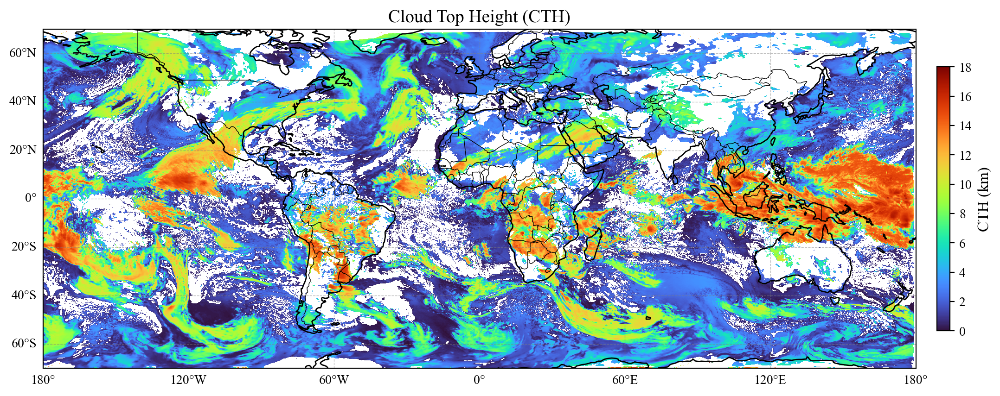

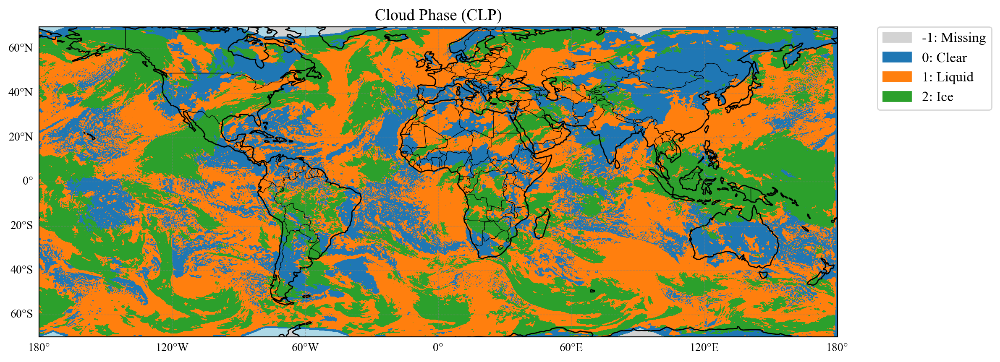

In [9]:
import numpy as np
from netCDF4 import Dataset
import matplotlib.pyplot as plt
from plotfunction import plot_single_variable,plot_classification

# 设置字体
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['axes.unicode_minus'] = False

# 读取数据
nc_path = "/home/Data_Pool/zhaolx/Cloud/2019/20190101.nc"
with Dataset(nc_path, 'r') as ds:
    lat = ds.variables['latitude'][:]
    lon = ds.variables['longitude'][:]
    cot = ds.variables['cot'][7, :, :]   # Cloud Optical Thickness
    cer = ds.variables['cer'][7, :, :]   # Cloud Effective Radius
    cth = ds.variables['cth'][7, :, :]   # Cloud Top Height
    clp = ds.variables['clp'][7, :, :]
Lon2d, Lat2d = np.meshgrid(lon, lat)

# 公共绘图函数

# 分别绘制三个变量
plot_single_variable(cot, "Cloud Optical Thickness (COT)", Lon2d, Lat2d, vmin=0, vmax=120, cmap='turbo', cbar_label='COT')
plot_single_variable(cer, "Cloud Effective Radius (CER)", Lon2d, Lat2d, vmin=0, vmax=70, cmap='turbo', cbar_label='CER (μm)')
plot_single_variable(cth, "Cloud Top Height (CTH)", Lon2d, Lat2d, vmin=0, vmax=18, cmap='turbo', cbar_label='CTH (km)')
plot_classification(clp, "Cloud Phase (CLP)", Lon2d, Lat2d)


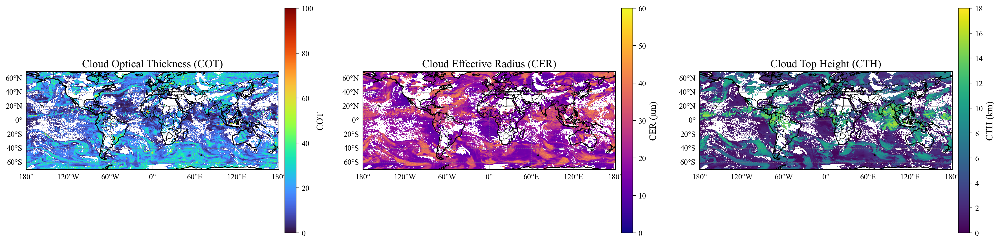

In [ ]:
import numpy as np
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# 设置字体
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['axes.unicode_minus'] = False

# 读取数据
nc_path = "/home/Data_Pool/zhaolx/Cloud/2022/20221001.nc"
with Dataset(nc_path, 'r') as ds:
    lat = ds.variables['latitude'][:]
    lon = ds.variables['longitude'][:]
    cot = ds.variables['cot'][0, :, :]   # Cloud Optical Thickness
    cer = ds.variables['cer'][0, :, :]   # Cloud Effective Radius
    cth = ds.variables['cth'][0, :, :]   # Cloud Top Height

Lon2d, Lat2d = np.meshgrid(lon, lat)

# 创建绘图画布
fig, axs = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()}, dpi=200)

# 公共函数：绘制单图层
def plot_variable(ax, data, title, vmin, vmax, cmap, cbar_label):
    pcm = ax.pcolormesh(Lon2d, Lat2d, data, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='white')
    ax.add_feature(cfeature.OCEAN, facecolor='white')
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = gl.right_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
    ax.set_title(title, fontsize=14)
    cbar = plt.colorbar(pcm, ax=ax, orientation='vertical', pad=0.02, shrink=0.7)
    cbar.set_label(cbar_label, fontsize=12)

# COT
plot_variable(axs[0], cot, "Cloud Optical Thickness (COT)", vmin=0, vmax=100, cmap='turbo', cbar_label='COT')

# CER
plot_variable(axs[1], cer, "Cloud Effective Radius (CER)", vmin=0, vmax=60, cmap='turbo', cbar_label='CER (μm)')

# CTH
plot_variable(axs[2], cth, "Cloud Top Height (CTH)", vmin=0, vmax=18, cmap='turbo', cbar_label='CTH (km)')

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
# ——— 全局设置字体为 Times New Roman —————————————————————————————————————————
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['axes.unicode_minus'] = False
# 定义文件路径
nc_path = "/home/Data_Pool/zhaolx/Cloud/2022/20221001.nc"

# 打开 NetCDF 文件并读取经纬度和 cot 变量的第 0 帧
with Dataset(nc_path, 'r') as ds:
    lat = ds.variables['latitude'][:]    # 形状 (n_lat,)
    lon = ds.variables['longitude'][:]   # 形状 (n_lon,)
    cot = ds.variables['cer'][0, :, :]   # 形状 (n_lat, n_lon)


# 构造二维经纬度网格
Lon2d, Lat2d = np.meshgrid(lon, lat)

# 设置绘图参数
LABEL_MIN = 0
LABEL_MAX = 60  # 用于色标上限

# 创建带海岸线的投影坐标系
fig = plt.figure(figsize=(12, 6),dpi=200)
ax = plt.axes(projection=ccrs.PlateCarree())

# 绘制 COT 场，用 pcolormesh 可以正确对应经纬度
pcm = ax.pcolormesh(
    Lon2d, Lat2d, cot,
    cmap='turbo',
    vmin=LABEL_MIN,
    vmax=LABEL_MAX,
    shading='auto',
    transform=ccrs.PlateCarree()
)


# ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.5)
# ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':', linewidth=0.3)
# 添加地理要素
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor='white')
ax.add_feature(cfeature.OCEAN, facecolor='white')


# 添加经纬度刻度
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}
gl.xformatter = LongitudeFormatter()
gl.yformatter = LatitudeFormatter()

# 添加标题与色标
# ax.set_title("CER on 2022-01-01 00:00 UTC", fontsize=14)
cbar = plt.colorbar(pcm, ax=ax, orientation='vertical', pad=0.02, shrink=0.5)
cbar.set_label('CER', fontsize=12)

plt.tight_layout()
plt.show()
